# Module 10 — Trajectory & Pseudotime Analysis (v5)

This notebook visualizes pre-computed trajectory and pseudotime results from
`scripts/10_trajectory.py`. PAGA (Partition-based Graph Abstraction) is used
to infer cell state transitions, and diffusion pseudotime (DPT) orders cells
along differentiation/degeneration trajectories.

**Pipeline version:** v5 (CCA-based, 12 modules)

**Data sources:**
- `results/trajectories/paga_*.png` — PAGA connectivity graphs
- `results/trajectories/umap_trajectory_*.png` — UMAP with pseudotime overlay
- `results/trajectories/pseudotime_by_condition_*.png` — Pseudotime distributions
- `results/trajectories/pseudotime_by_celltype_*.png` — Cell type ordering
- `results/trajectories/gene_dynamics_*.png` — Gene expression over pseudotime
- `results/trajectories/pseudotime_correlations_*.tsv` — Statistical tests
- `results/trajectories/trajectory_genes_*.tsv` — Genes correlated with pseudotime
- `results/trajectories/trajectory_de_overlap_*.tsv` — Overlap with Module 08 DE genes

In [1]:
import warnings
warnings.filterwarnings('ignore', category=FutureWarning)
warnings.filterwarnings('ignore', category=UserWarning)

from pathlib import Path

import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import Image, display, Markdown

plt.rcParams.update({'figure.dpi': 120, 'savefig.dpi': 200, 'savefig.bbox': 'tight'})

# ── Paths ──────────────────────────────────────────────────────────────────
BASE = Path('..').resolve()
RESULTS = BASE / 'results' / 'trajectories'

print(f'Results directory: {RESULTS}')
print(f'PNG files: {len(list(RESULTS.glob("*.png")))}')
print(f'TSV files: {len(list(RESULTS.glob("*.tsv")))}')

Results directory: /home/ubuntu/lotz-ivd/results/trajectories
PNG files: 15
TSV files: 12


## Pseudotime-Condition Correlations

Spearman correlation between pseudotime and condition (encoded as ordinal:
healthy < mild < severe). A negative correlation means degenerated cells
occupy earlier pseudotime positions; a positive correlation means degenerated
cells are at later positions.

In [2]:
# Load and display correlation results for each compartment
compartments = ['NP', 'AF', 'CEP']

all_corrs = []
for comp in compartments:
    corr_path = RESULTS / f'pseudotime_correlations_{comp}.tsv'
    if corr_path.exists():
        df = pd.read_csv(corr_path, sep='\t')
        if 'compartment' not in df.columns:
            df.insert(0, 'compartment', comp)
        else:
            df['compartment'] = comp
        all_corrs.append(df)

if all_corrs:
    corr_df = pd.concat(all_corrs, ignore_index=True)
    display(corr_df.style.set_caption('Pseudotime-Condition Correlations by Compartment'))
else:
    print('No correlation files found')

,compartment,embedding,test,rho,pvalue,n,statistic,n_healthy,n_degen,median_healthy,median_degen
0,NP,scVI_mesenchymal,pseudotime_vs_condition_ordinal,-0.088212,0.000000,50000.000000,nan,nan,nan,nan,nan
1,NP,scVI_mesenchymal,pseudotime_healthy_vs_degenerated,nan,0.000000,nan,265757792.000000,14617.000000,29917.000000,0.080461,0.050317
2,NP,scVI_mesenchymal,pseudotime_vs_condition_NP_mature_chondrocyte,-0.001771,0.770898,27047.000000,nan,nan,nan,nan,nan
3,NP,scVI_mesenchymal,pseudotime_vs_condition_NP_fibrocartilaginous,-0.201743,0.000000,22953.000000,nan,nan,nan,nan,nan
4,AF,scVI_mesenchymal,pseudotime_vs_condition_ordinal,0.194748,0.000000,50000.000000,nan,nan,nan,nan,nan
5,AF,scVI_mesenchymal,pseudotime_healthy_vs_degenerated,nan,0.000000,nan,277089888.000000,24771.000000,25229.000000,0.658655,0.658686
6,AF,scVI_mesenchymal,pseudotime_vs_condition_AF_outer,0.109567,0.000000,37752.000000,nan,nan,nan,nan,nan
7,AF,scVI_mesenchymal,pseudotime_vs_condition_AF_inner,0.217831,0.000000,12248.000000,nan,nan,nan,nan,nan
8,CEP,scVI_mesenchymal,pseudotime_vs_condition_ordinal,0.073357,0.000000,32141.000000,nan,nan,nan,nan,nan
9,CEP,scVI_mesenchymal,pseudotime_healthy_vs_degenerated,nan,0.000000,nan,107610096.000000,20470.000000,11671.000000,0.065250,0.066184


## PAGA Connectivity Graphs

PAGA shows the connectivity between cell type clusters in the trajectory graph.
Edge thickness represents the strength of connection, revealing which cell
states are transcriptionally adjacent.

### NP — PAGA Graph

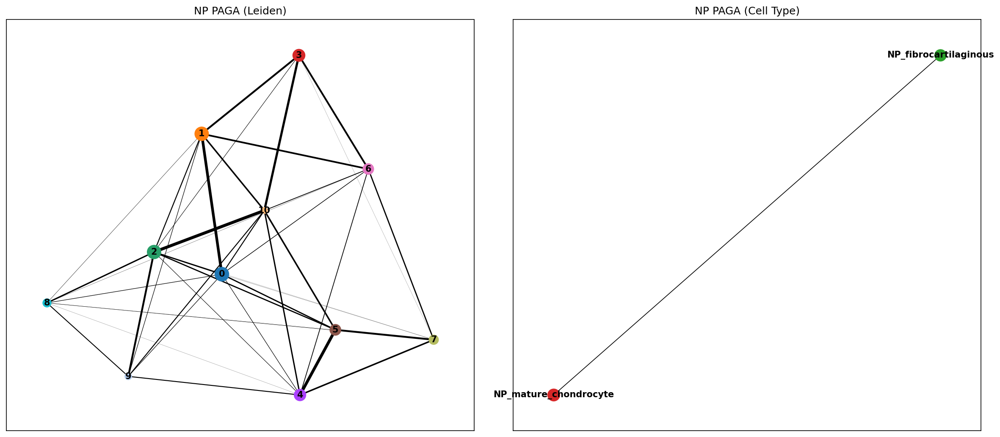

### AF — PAGA Graph

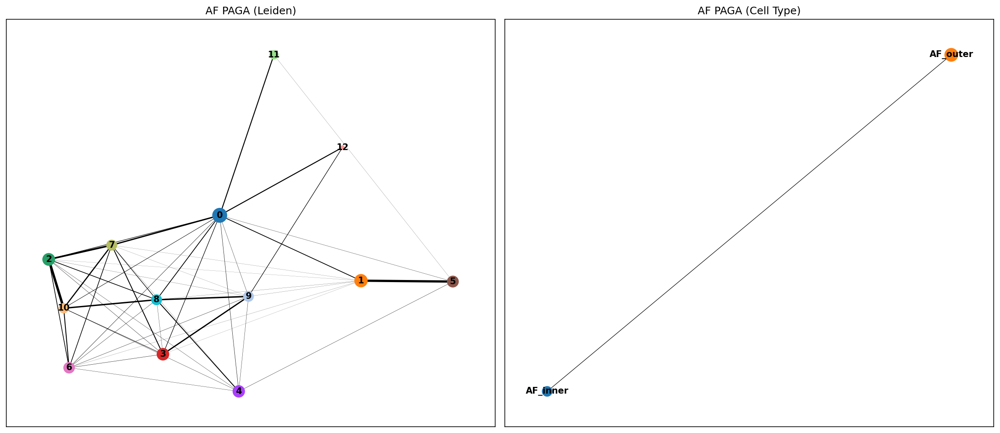

### CEP — PAGA Graph

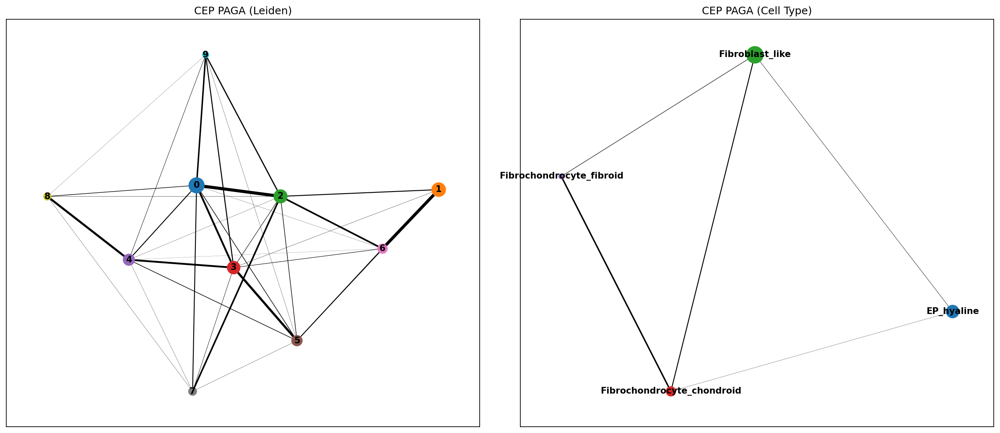

In [3]:
for comp in compartments:
    paga_path = RESULTS / f'paga_{comp}.png'
    if paga_path.exists():
        display(Markdown(f'### {comp} — PAGA Graph'))
        display(Image(filename=str(paga_path), width=700))
    else:
        print(f'PAGA plot not found for {comp}')

## Pseudotime by Condition

Distribution of pseudotime values for each condition (healthy, mild degeneration,
severe degeneration). Shifts in the distribution indicate trajectory position
changes with disease.

### NP — Pseudotime by Condition

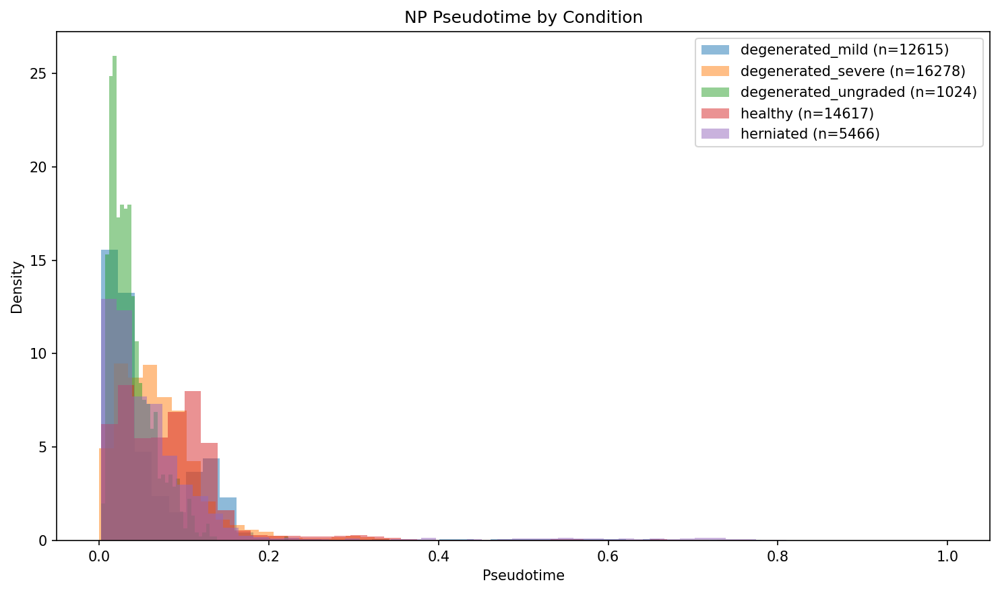

### AF — Pseudotime by Condition

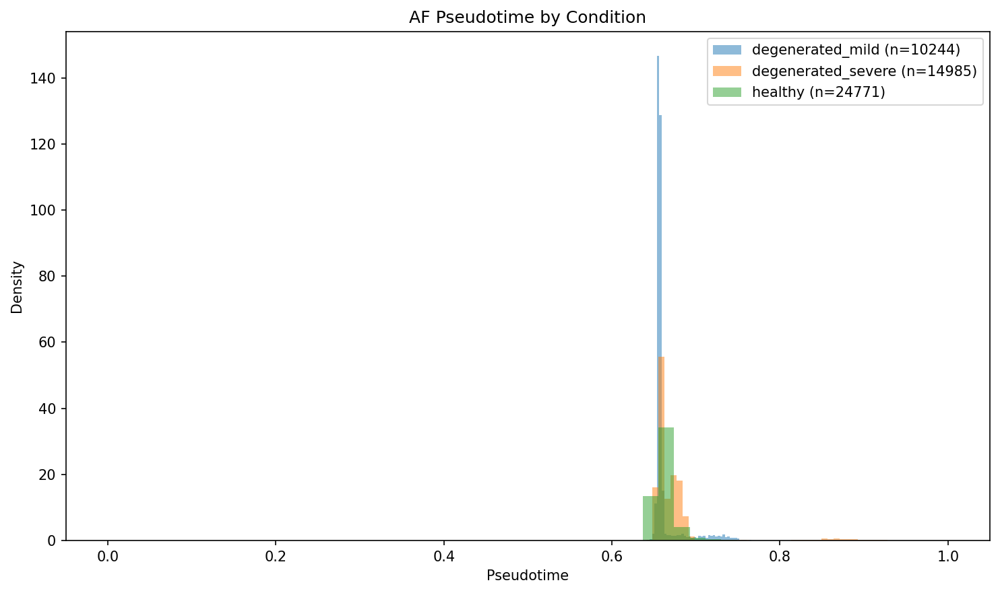

### CEP — Pseudotime by Condition

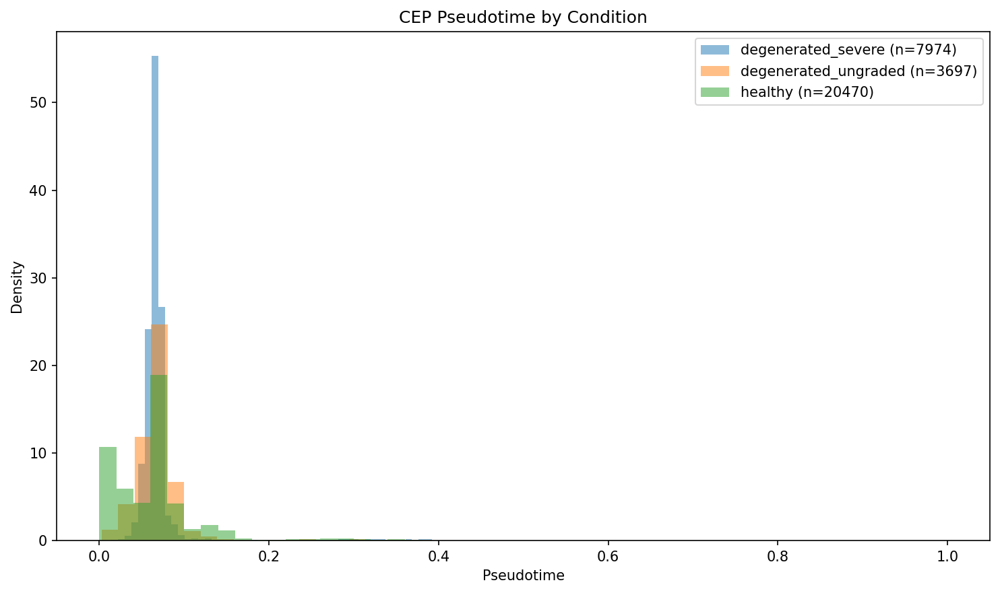

In [4]:
for comp in compartments:
    pt_cond_path = RESULTS / f'pseudotime_by_condition_{comp}.png'
    if pt_cond_path.exists():
        display(Markdown(f'### {comp} — Pseudotime by Condition'))
        display(Image(filename=str(pt_cond_path), width=700))
    else:
        print(f'Pseudotime by condition plot not found for {comp}')

## Pseudotime by Cell Type

Pseudotime ordering across cell types within each compartment. This reveals
the progression from one cell state to another along the trajectory.

### NP — Pseudotime by Cell Type

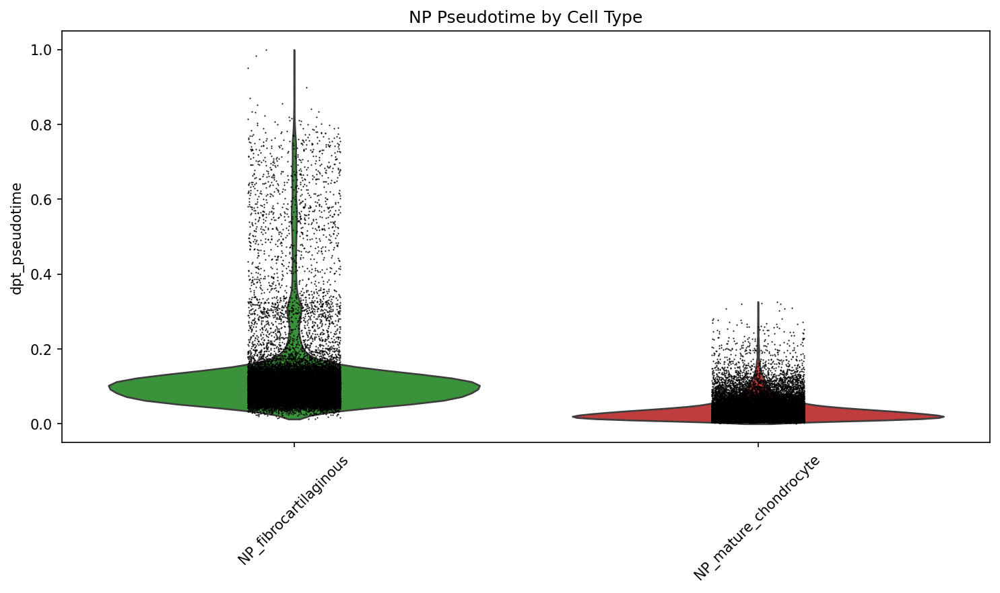

### AF — Pseudotime by Cell Type

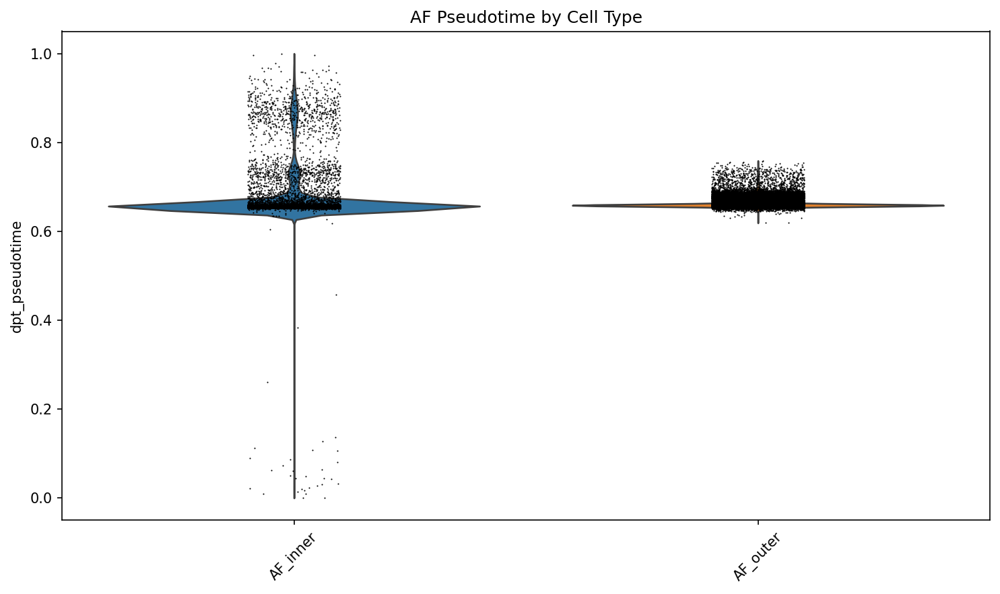

### CEP — Pseudotime by Cell Type

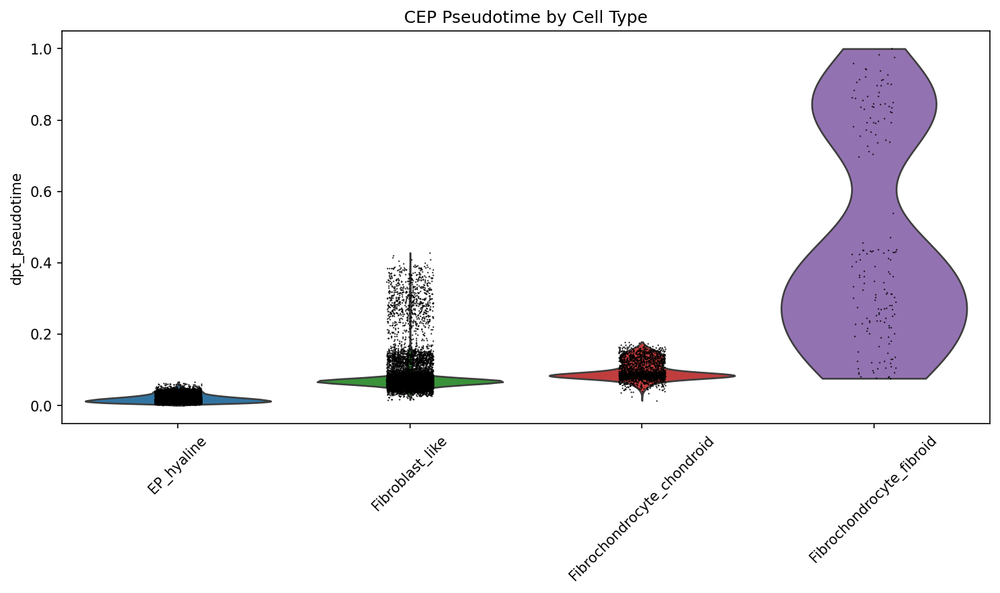

In [5]:
for comp in compartments:
    pt_ct_path = RESULTS / f'pseudotime_by_celltype_{comp}.png'
    if pt_ct_path.exists():
        display(Markdown(f'### {comp} — Pseudotime by Cell Type'))
        display(Image(filename=str(pt_ct_path), width=700))
    else:
        print(f'Pseudotime by cell type plot not found for {comp}')

## Gene Dynamics Along Pseudotime

Expression of key genes plotted as a function of pseudotime. These show how
marker gene expression changes along the trajectory, highlighting the genes
that drive cell state transitions.

### NP — Gene Dynamics

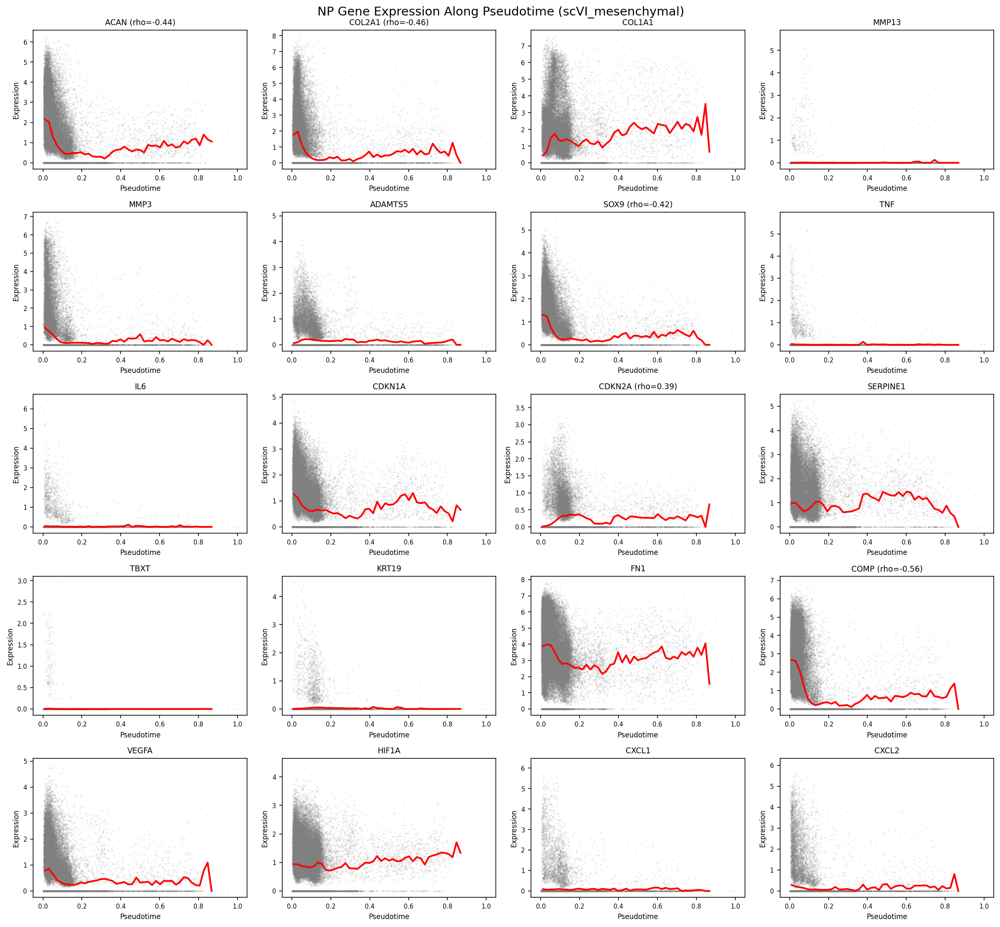

### AF — Gene Dynamics

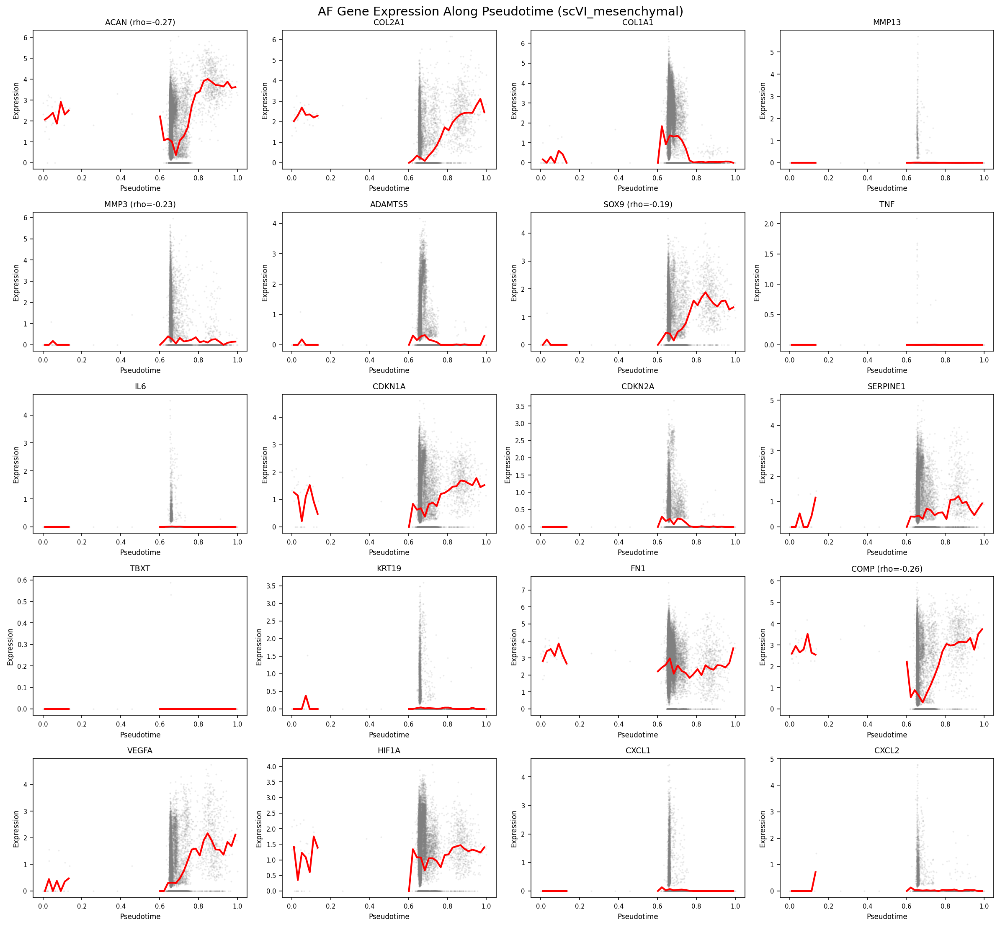

### CEP — Gene Dynamics

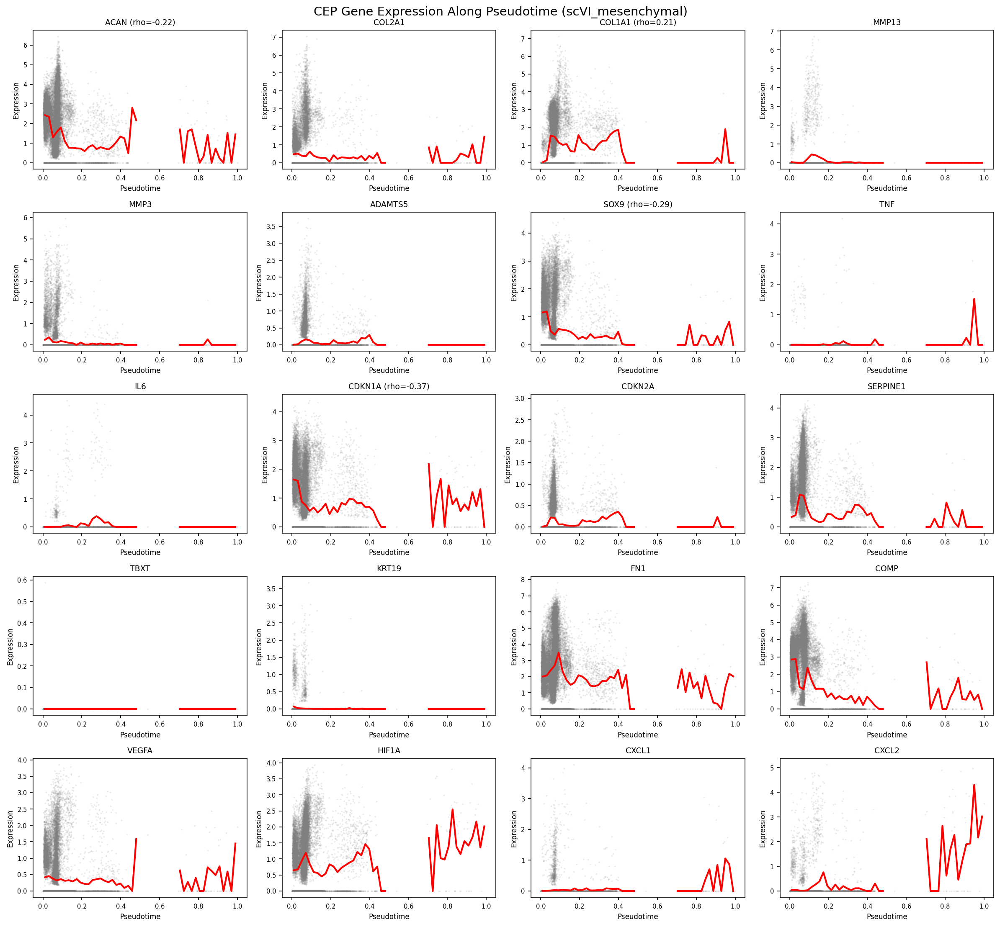

In [6]:
for comp in compartments:
    gene_path = RESULTS / f'gene_dynamics_{comp}.png'
    if gene_path.exists():
        display(Markdown(f'### {comp} — Gene Dynamics'))
        display(Image(filename=str(gene_path), width=800))
    else:
        print(f'Gene dynamics plot not found for {comp}')

## Trajectory-Associated Genes

Genes most strongly correlated with pseudotime in each compartment. These
are candidate drivers of the degeneration trajectory.

In [7]:
for comp in compartments:
    tg_path = RESULTS / f'trajectory_genes_{comp}.tsv'
    if tg_path.exists():
        tg = pd.read_csv(tg_path, sep='\t')
        display(Markdown(f'### {comp} — Top Trajectory Genes'))
        print(f'Total trajectory genes: {len(tg)}')
        display(tg.head(20).style.set_caption(f'{comp}: Top 20 Trajectory-Associated Genes'))
    else:
        print(f'Trajectory genes file not found for {comp}')

### NP — Top Trajectory Genes

Total trajectory genes: 500


,gene,rho,pvalue,padj,program
0,PRELP,-0.607950,0.000000,0.000000,late_down
1,LGALS1,0.606067,0.000000,0.000000,late_up
2,NME2,0.604153,0.000000,0.000000,late_up
3,TMSB4X,0.603014,0.000000,0.000000,late_up
4,SERPINA1,-0.596734,0.000000,0.000000,late_down
5,FGFBP2,-0.595867,0.000000,0.000000,late_down
6,PRSS23,0.592353,0.000000,0.000000,late_up
7,TMSB10,0.585289,0.000000,0.000000,late_up
8,MGP,-0.580260,0.000000,0.000000,late_down
9,RNASEK,0.560624,0.000000,0.000000,late_up


### AF — Top Trajectory Genes

Total trajectory genes: 500


,gene,rho,pvalue,padj,program
0,C2orf40,-0.385663,0.000000,0.000000,late_down
1,RPLP1,-0.361745,0.000000,0.000000,late_down
2,RPS27A,-0.351518,0.000000,0.000000,late_down
3,MIA,-0.345849,0.000000,0.000000,late_down
4,RPL32,-0.340642,0.000000,0.000000,late_down
5,GPX1,-0.338578,0.000000,0.000000,late_down
6,RPL41,-0.336852,0.000000,0.000000,late_down
7,MT2A,-0.336613,0.000000,0.000000,late_down
8,RPL8,-0.336202,0.000000,0.000000,late_down
9,RPS13,-0.334765,0.000000,0.000000,late_down


### CEP — Top Trajectory Genes

Total trajectory genes: 500


,gene,rho,pvalue,padj,program
0,CRYAB,-0.524648,0.000000,0.000000,late_down
1,UBC,-0.506532,0.000000,0.000000,late_down
2,IL17B,-0.488161,0.000000,0.000000,late_down
3,RPL8,-0.474841,0.000000,0.000000,late_down
4,RBP4,-0.466345,0.000000,0.000000,late_down
5,SPINT2,-0.465154,0.000000,0.000000,late_down
6,RPL9P9,-0.463327,0.000000,0.000000,late_down
7,EIF1,-0.460613,0.000000,0.000000,late_down
8,CNMD,-0.453934,0.000000,0.000000,late_down
9,FBXO2,-0.451874,0.000000,0.000000,late_down


## Overlap with Differential Expression

Trajectory-associated genes that also appear in the pseudobulk DE results
from Module 08. This overlap strengthens confidence in both analyses.

In [8]:
for comp in compartments:
    overlap_path = RESULTS / f'trajectory_de_overlap_{comp}.tsv'
    if overlap_path.exists():
        overlap = pd.read_csv(overlap_path, sep='\t')
        display(Markdown(f'### {comp} — Trajectory-DE Overlap'))
        print(f'Overlapping genes: {len(overlap)}')
        if len(overlap) > 0:
            display(overlap.head(20).style.set_caption(
                f'{comp}: Genes in Both Trajectory and DE Analyses'))
    else:
        print(f'Trajectory-DE overlap file not found for {comp}')

### NP — Trajectory-DE Overlap

Overlapping genes: 51


,gene,rho,pvalue,padj_x,program,cell_type,comparison,log2FC,padj_y
0,SERPINA1,-0.596734,0.000000,0.000000,late_down,AF_outer,healthy_vs_degenerated_mild,-6.386315,0.011547
1,FGFBP2,-0.595867,0.000000,0.000000,late_down,AF_outer,healthy_vs_degenerated_mild,-7.102835,0.010221
2,S100B,-0.473876,0.000000,0.000000,late_down,AF_outer,healthy_vs_degenerated_mild,-4.159024,0.049730
3,TMEM158,0.468303,0.000000,0.000000,late_up,NP_mature_chondrocyte,mild_vs_severe,1.548476,0.019967
4,SEPTIN11,0.466417,0.000000,0.000000,late_up,NP_mature_chondrocyte,mild_vs_severe,0.902948,0.003550
5,COL2A1,-0.460602,0.000000,0.000000,late_down,AF_outer,healthy_vs_degenerated_mild,-8.083327,0.036398
6,STMN1,0.442449,0.000000,0.000000,late_up,NP_fibrocartilaginous,healthy_vs_degenerated_severe,-1.521375,0.018099
7,STMN1,0.442449,0.000000,0.000000,late_up,NP_fibrocartilaginous,mild_vs_severe,-0.853362,0.007762
8,CLEC3A,-0.435875,0.000000,0.000000,late_down,AF_outer,healthy_vs_degenerated_mild,-9.450959,0.023767
9,MT1G,-0.428814,0.000000,0.000000,late_down,AF_outer,healthy_vs_degenerated_mild,-9.112063,0.000285


### AF — Trajectory-DE Overlap

Overlapping genes: 53


,gene,rho,pvalue,padj_x,program,cell_type,comparison,log2FC,padj_y
0,C2orf40,-0.385663,0.000000,0.000000,late_down,AF_outer,healthy_vs_degenerated_mild,-20.923420,0.000111
1,GPX1,-0.338578,0.000000,0.000000,late_down,AF_outer,healthy_vs_degenerated_mild,-14.186570,0.007585
2,C6orf48,-0.318999,0.000000,0.000000,late_down,AF_outer,healthy_vs_degenerated_mild,-14.286038,0.007585
3,MT-ATP6,0.312915,0.000000,0.000000,late_up,AF_outer,healthy_vs_degenerated_mild,-1.601324,0.004367
4,MT-CO3,0.306213,0.000000,0.000000,late_up,AF_outer,healthy_vs_degenerated_mild,-1.372775,0.046503
5,FGFBP2,-0.305232,0.000000,0.000000,late_down,AF_outer,healthy_vs_degenerated_mild,-7.102835,0.010221
6,H2AFZ,-0.304731,0.000000,0.000000,late_down,NP_fibrocartilaginous,mild_vs_severe,-0.782719,0.007762
7,SERPINA1,-0.304420,0.000000,0.000000,late_down,AF_outer,healthy_vs_degenerated_mild,-6.386315,0.011547
8,MT1G,-0.303485,0.000000,0.000000,late_down,AF_outer,healthy_vs_degenerated_mild,-9.112063,0.000285
9,LRRC75A-AS1,-0.302612,0.000000,0.000000,late_down,AF_outer,healthy_vs_degenerated_mild,-15.230980,0.003202


### CEP — Trajectory-DE Overlap

Overlapping genes: 65


,gene,rho,pvalue,padj_x,program,cell_type,comparison,log2FC,padj_y
0,RPL9P9,-0.463327,0.000000,0.000000,late_down,AF_outer,healthy_vs_degenerated_mild,-13.763833,0.010002
1,SERPINA1,-0.446656,0.000000,0.000000,late_down,AF_outer,healthy_vs_degenerated_mild,-6.386315,0.011547
2,H2AFZ,-0.445861,0.000000,0.000000,late_down,NP_fibrocartilaginous,mild_vs_severe,-0.782719,0.007762
3,CLEC3A,-0.440307,0.000000,0.000000,late_down,AF_outer,healthy_vs_degenerated_mild,-9.450959,0.023767
4,TUBB2B,-0.437275,0.000000,0.000000,late_down,AF_outer,healthy_vs_degenerated_mild,-4.148896,0.020766
5,S100B,-0.424671,0.000000,0.000000,late_down,AF_outer,healthy_vs_degenerated_mild,-4.159024,0.049730
6,FGFBP2,-0.418587,0.000000,0.000000,late_down,AF_outer,healthy_vs_degenerated_mild,-7.102835,0.010221
7,COL9A2,-0.400663,0.000000,0.000000,late_down,AF_outer,healthy_vs_degenerated_mild,-5.898843,0.023950
8,CHAD,-0.393382,0.000000,0.000000,late_down,AF_outer,healthy_vs_degenerated_mild,-10.090876,0.020766
9,CYTL1,-0.390835,0.000000,0.000000,late_down,NP_fibrocartilaginous,healthy_vs_degenerated_all,4.375250,0.001653


## UMAP with Pseudotime Overlay

UMAP colored by pseudotime values, showing the spatial distribution of the
trajectory on the CCA-integrated embedding.

### NP — UMAP Trajectory

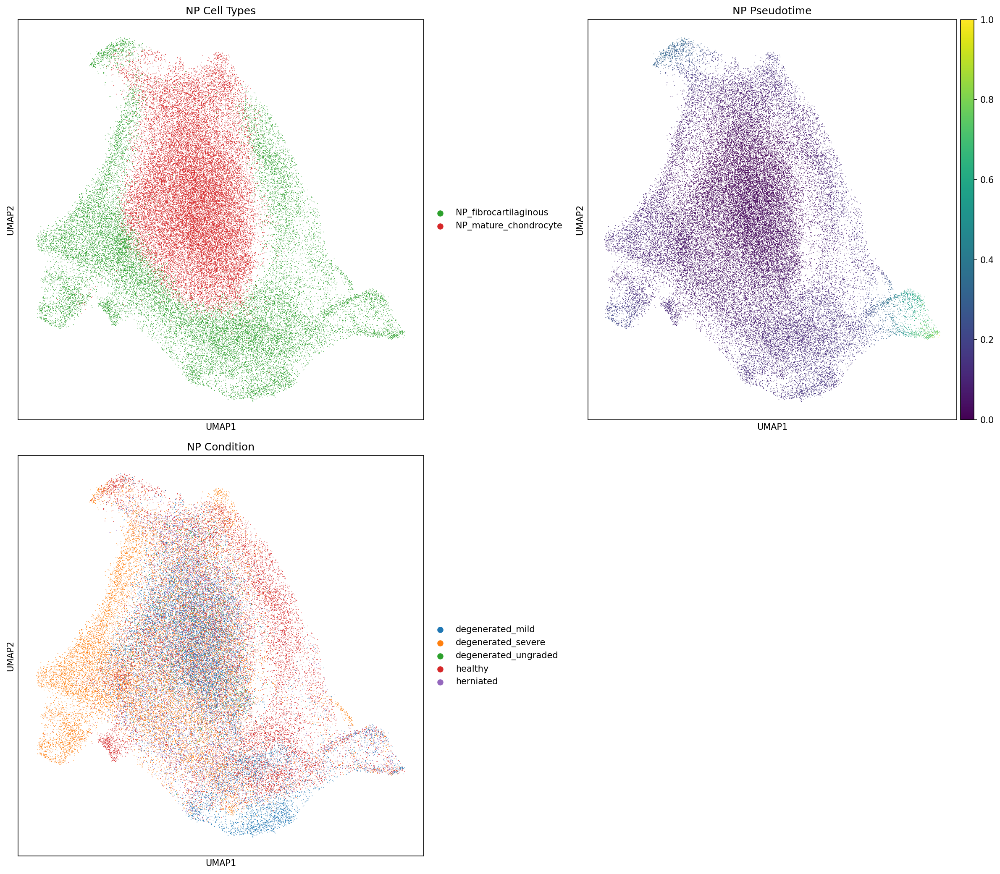

### AF — UMAP Trajectory

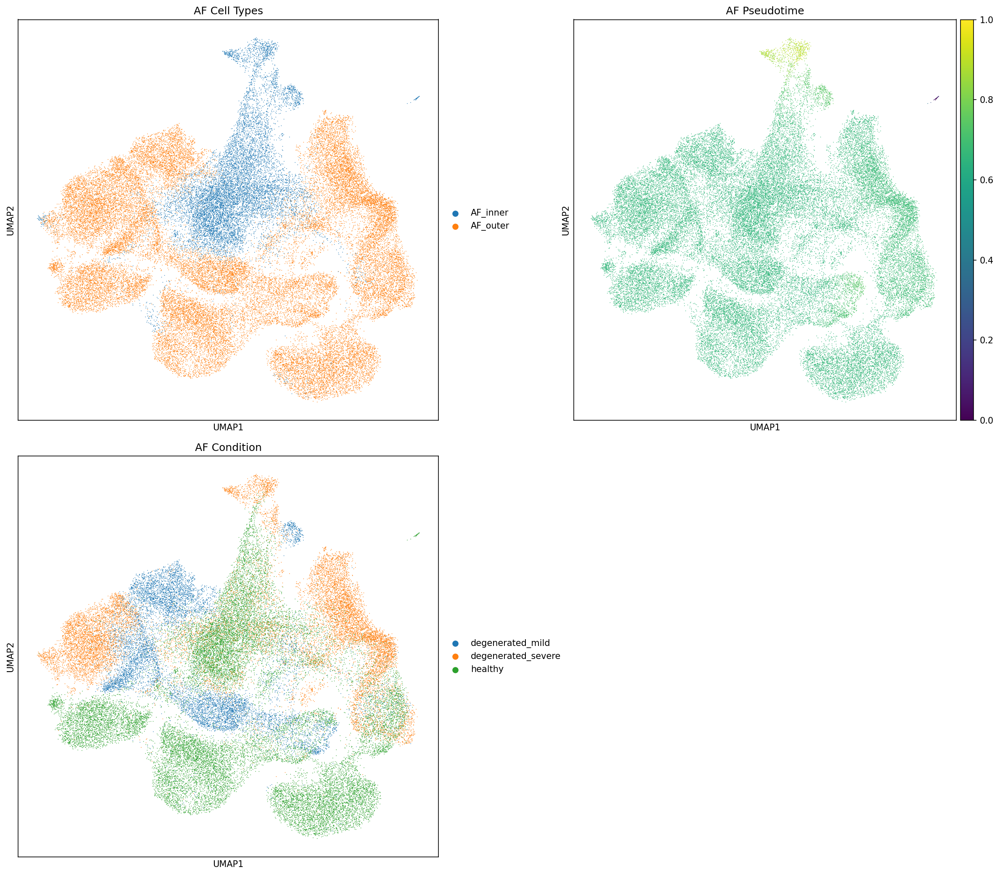

### CEP — UMAP Trajectory

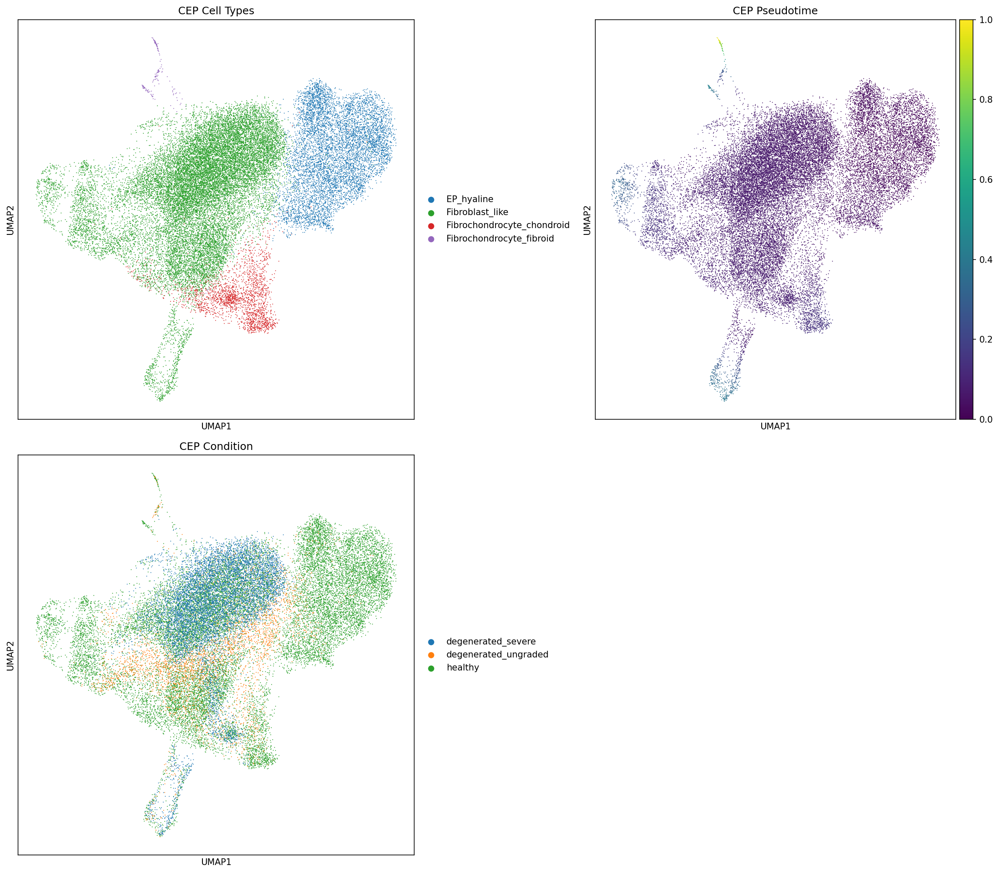

In [9]:
# UMAP trajectory plots
for comp in ['NP', 'AF', 'CEP']:
    umap_traj_path = RESULTS / f'umap_trajectory_{comp}.png'
    if umap_traj_path.exists():
        display(Markdown(f'### {comp} — UMAP Trajectory'))
        display(Image(filename=str(umap_traj_path), width=700))

## Status — Module 10 Complete (v5 + tiered v4 2026-05-22)

### v5 (CCA-flat) summary
- PAGA + DPT trajectories computed for NP, AF, and CEP compartments.
- Pseudotime-condition correlations: NP rho=-0.088, AF rho=+0.195, CEP rho=+0.073.

### Tiered v4 summary (2026-05-22, this run)
- Same DPT pipeline rerun on the tiered v4 atlas; mesenchymal tier only (NP 187,257 cells, AF 72,605, CEP 36,879; downsampled to 50K NP/AF for PAGA, 36,879 CEP).
- **Pseudotime vs condition (ordinal):** NP rho=-0.004 (p=0.41), AF rho=-0.003 (p=0.49), CEP rho=+0.077 (p=1.9e-49).
- **Healthy vs degenerated MWU:** All three compartments significant (NP p=3e-4, AF p=1e-20, CEP p=2e-43), though absolute median shifts in pseudotime are small.
- **Per-cell-type effects are stronger than the compartment ordinal correlation** — e.g. AF_inner rho=+0.54, AF_outer rho=-0.30; CEP_hyaline rho=+0.17, CEP_outer rho=-0.21 — consistent with cell-type-specific trajectories within each compartment.
- **Trajectory-DE overlap:** NP 328 / 500 trajectory genes overlap DE (66%), AF 326 (65%), CEP 338 (68%).
- 500 trajectory-associated genes per compartment saved with `late_up` / `late_down` / `stable` program labels.

### Mechanism behind the version shift (v5 → tiered v4)
Tiered v4's finer cell-type partitioning redistributes pseudotime signal into within-cell-type gradients (e.g. AF_inner vs AF_outer trending in opposite directions) instead of a single compartment-wide ordinal correlation. **Trajectory direction is a version-sensitive finding** (memory entry: "AF/CEP trajectory directions flipped between versions"); the conservative read is that the discrete healthy-vs-degenerated shift is real but the compartment-level direction is not a robust claim.

### Caveats
- RNA velocity unavailable — no spliced/unspliced layers in public count matrices. Pseudotime is DPT-only.
- NP and AF were downsampled to 50K cells for PAGA tractability; CEP processed in full.
- Root cluster chosen by max enrichment of the expected mature/inner population (NP_mature_chondrocyte, AF_inner, CEP_hyaline) — directionality depends on this choice.

### Next steps
- Module 11: Cell-cell communication analysis (LIANA) — tiered v4 rerun.
- Manuscript draft (`docs/MANUSCRIPT.md`) replaces Module 12 for this version.


## §2 — Tiered v4 Results (2026-05-22 rerun)

Trajectory + DPT pseudotime rerun against the tiered v4 atlas. Output directory:
`results/trajectories/tiered_v4/`. Same `scripts/10_trajectory.py` invoked with
`--input-dir data/integrated/tiered_v4`, `--output-dir results/trajectories/tiered_v4`,
`--de-dir results/differential/tiered_v4`.

Mesenchymal tier only (cells with `cell_class` ∈ NP/AF/CEP mesenchymal sub-states).
NP and AF downsampled to 50K cells each before PAGA; CEP run in full (36,879).

**Headline correlations vs v5 (memory):**

| Compartment | v5 rho | Tiered v4 rho (ordinal) | Tiered v4 H-vs-D p |
|---|---:|---:|---:|
| NP  | −0.088 | **−0.004** (p=0.41)    | 3.0e-04 |
| AF  | +0.195 | **−0.003** (p=0.49)    | 1.1e-20 |
| CEP | +0.073 | **+0.077** (p=1.9e-49) | 1.6e-43 |

Compartment-level ordinal correlations weaken substantially in tiered v4 — signal
redistributes into within-cell-type gradients (e.g. AF_inner ρ=+0.54 vs
AF_outer ρ=−0.30). MWU healthy-vs-degenerated tests remain highly significant in
all three compartments, so the *discrete* healthy/degenerated shift is robust
even though the compartment-level *direction* is not.


In [ ]:
# Tiered v4 paths and summary tables
TV4 = BASE / 'results' / 'trajectories' / 'tiered_v4'
print(f'Tiered v4 trajectories directory: {TV4}')
print(f'PNG files: {len(list(TV4.glob("*.png")))}')
print(f'TSV files: {len(list(TV4.glob("*.tsv")))}')

for comp in ('NP', 'AF', 'CEP'):
    print(f'\n── {comp} pseudotime correlations ──')
    corr = pd.read_csv(TV4 / f'pseudotime_correlations_{comp}.tsv', sep='\t')
    display(corr.round(4))


### §2a — PAGA Connectivity (tiered v4)

Partition-based graph abstraction of the mesenchymal tier per compartment.
Node size encodes cluster size; edge weight encodes connectivity strength.


In [ ]:
from PIL import Image as PILImage
import io

def _show_compressed(path, max_width=1200, quality=88):
    img = PILImage.open(str(path)).convert('RGB')
    if img.width > max_width:
        ratio = max_width / img.width
        img = img.resize((max_width, int(img.height * ratio)), PILImage.LANCZOS)
    buf = io.BytesIO()
    img.save(buf, format='JPEG', quality=quality, optimize=True)
    display(Image(data=buf.getvalue(), format='jpeg'))

for comp in ('NP', 'AF', 'CEP'):
    fpath = TV4 / f'paga_{comp}.png'
    if fpath.exists():
        display(Markdown(f'#### PAGA — {comp}'))
        _show_compressed(fpath)


### §2b — Pseudotime by Condition (tiered v4)

Distribution of DPT pseudotime stratified by `condition_harmonized`.
Small median shifts but large sample sizes drive the highly significant MWU
p-values in all three compartments.


In [ ]:
for comp in ('NP', 'AF', 'CEP'):
    fpath = TV4 / f'pseudotime_by_condition_{comp}.png'
    if fpath.exists():
        display(Markdown(f'#### Pseudotime by condition — {comp}'))
        _show_compressed(fpath)


### §2c — Pseudotime by Cell Type (tiered v4)

DPT pseudotime per cell_type. The within-cell-type gradients dominate the
compartment-level correlation in tiered v4 (e.g. AF_inner vs AF_outer trend
in opposite directions).


In [ ]:
for comp in ('NP', 'AF', 'CEP'):
    fpath = TV4 / f'pseudotime_by_celltype_{comp}.png'
    if fpath.exists():
        display(Markdown(f'#### Pseudotime by cell type — {comp}'))
        _show_compressed(fpath)


### §2d — Gene Dynamics Along Pseudotime (tiered v4)

Expression of top trajectory-associated genes along DPT pseudotime,
labelled with their program assignment (`late_up`, `late_down`, `stable`).


In [ ]:
for comp in ('NP', 'AF', 'CEP'):
    fpath = TV4 / f'gene_dynamics_{comp}.png'
    if fpath.exists():
        display(Markdown(f'#### Gene dynamics — {comp}'))
        _show_compressed(fpath)


### §2e — Trajectory ∩ DE Overlap (tiered v4)

Genes that are both trajectory-associated (DPT correlation FDR < 0.05) and
differentially expressed (Module 08 pseudobulk DESeq2 FDR < 0.05).


In [ ]:
import pandas as pd
rows = []
for comp in ('NP', 'AF', 'CEP'):
    ov = pd.read_csv(TV4 / f'trajectory_de_overlap_{comp}.tsv', sep='\t')
    rows.append({'compartment': comp,
                 'trajectory_genes': 500,
                 'overlap_with_DE': len(ov),
                 'pct_overlap': round(100*len(ov)/500, 1)})
summary_overlap = pd.DataFrame(rows)
display(summary_overlap)

# Show top of NP overlap (the strongest signal compartment)
print('\nTop 15 overlap rows (NP, by |log2FC|):')
ov_np = pd.read_csv(TV4 / 'trajectory_de_overlap_NP.tsv', sep='\t')
ov_np['abs_log2FC'] = ov_np['log2FC'].abs()
display(ov_np.sort_values('abs_log2FC', ascending=False).head(15)[
    ['gene','program','cell_type','comparison','log2FC','padj_y']
])
